# BNB: Distance to a Sketched Region and Gene Expression Gradient Along it
Data is obtained from 10X Genomics

In [28]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
env: ANYWIDGET_HMR=1


In [29]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
from celldega.pre.boundary_tile import batch_transform_geometries
from celldega.pre.distance import DistanceToPolygon
from celldega.pre import to_geometry
import geopandas as gpd
from shapely.geometry import Point


# Data initialization

In [36]:
dataset_name = 'Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs'
# dataset_name = 'Xenium_V1_human_Pancreas_FFPE_outs'
tech = 'Xenium'

DATA_DIR = f'../data'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'{dataset_name}'

## Load region polygon (both in pixel and micron space)


In [37]:
# Load Geo parquet
gdf_pixel = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_pixel.parquet')
gdf_micron = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_micron.parquet')

## Transform points from pixel space to micron space

In [38]:
cell_meta = pd.read_parquet(f"{path_landscape_files}/cell_metadata.parquet")
cell_meta["geometry"] = cell_meta["geometry"].apply(lambda coords: Point(coords[0], coords[1]))
cell_meta_gdf = gpd.GeoDataFrame(cell_meta, geometry="geometry", crs="EPSG:4326")

gdf_join = gdf_pixel.sjoin(cell_meta_gdf, how='right', predicate='intersects').drop(columns=['index_left'], errors='ignore')
df_cluster = pd.read_parquet(f"{dataset_name}/cell_clusters/cluster.parquet")
gdf_join['cluster'] = df_cluster['cluster']

gene_list = ['EPCAM']

for gene in gene_list:
    df_gene = pd.read_parquet(f"{dataset_name}/cbg/{gene}.parquet")
    df_gene['cell_id'] = df_gene.index
    gdf_join = pd.merge(gdf_join, df_gene, on='cell_id', how='left')
    
gdf_join.head()

/Users/whuan/opt/anaconda3/envs/celldega_env_2025/lib/python3.10/site-packages/geopandas/geodataframe.py:2195: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)  # noqa: B026


,cell_id,area,roi,color,name,geometry,cluster,EPCAM
0,aaaaebmm-1,NaN,NaN,NaN,aaaaebmm-1,POINT (2545.24510 19907.04354),7,NaN
1,aaaafhpp-1,NaN,NaN,NaN,aaaafhpp-1,POINT (2507.57966 19966.68049),8,1.0
2,aaaahcem-1,NaN,NaN,NaN,aaaahcem-1,POINT (2483.01107 19955.99575),7,NaN
3,aaaakeoi-1,NaN,NaN,NaN,aaaakeoi-1,POINT (2514.67869 19925.56376),7,2.0
4,aaaalald-1,NaN,NaN,NaN,aaaalald-1,POINT (2482.79393 19919.32525),1,NaN


In [39]:
path_transformation_matrix = f'{path_landscape_files}/xenium_transform.csv'

transformation_matrix = pd.read_csv(
    path_transformation_matrix, header=None, sep=" "
).values

# From pixel to micron space
inverse_matrix = np.linalg.inv(transformation_matrix)
gdf_join_micron = gdf_join.copy()
gdf_join_micron["geometry"] = batch_transform_geometries(gdf_join_micron["geometry"], inverse_matrix, 1)
gdf_join_micron['geometry'] = gdf_join_micron['geometry'].apply(to_geometry)
gdf_join_micron.head()

,cell_id,area,roi,color,name,geometry,cluster,EPCAM
0,aaaaebmm-1,NaN,NaN,NaN,aaaaebmm-1,POINT (540.86462 4230.24707),7,NaN
1,aaaafhpp-1,NaN,NaN,NaN,aaaafhpp-1,POINT (532.86072 4242.91992),8,1.0
2,aaaahcem-1,NaN,NaN,NaN,aaaahcem-1,POINT (527.63989 4240.64941),7,NaN
3,aaaakeoi-1,NaN,NaN,NaN,aaaakeoi-1,POINT (534.36926 4234.18262),7,2.0
4,aaaalald-1,NaN,NaN,NaN,aaaalald-1,POINT (527.59375 4232.85693),1,NaN


# Select a polygon and calculate the distance from all cells to it

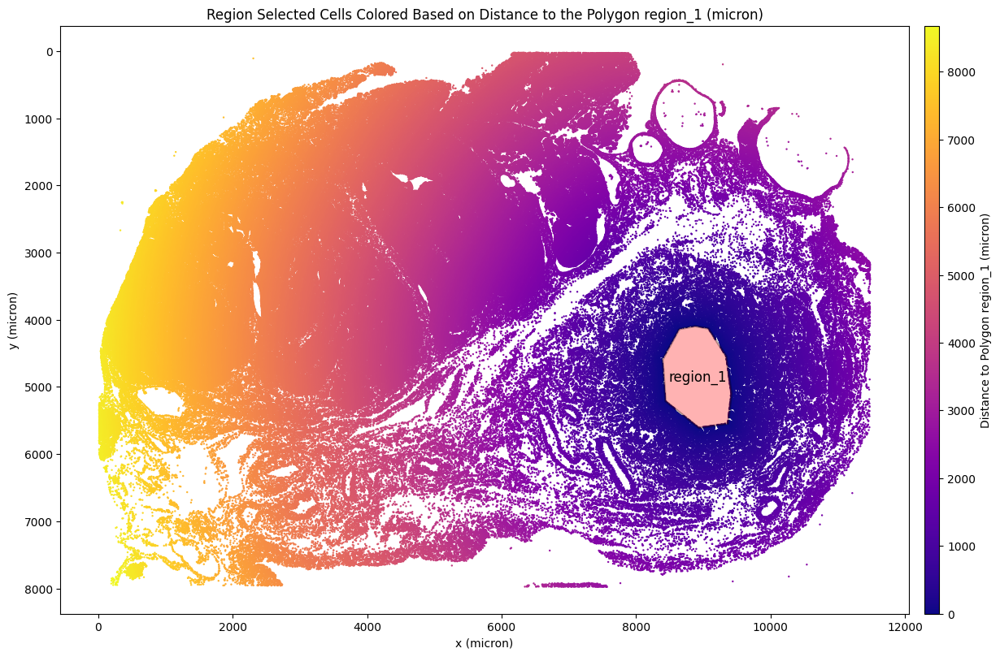

In [43]:
# Specify the polygon
roi_name = 'region_1'

# Initialize the class
distance_calculator = DistanceToPolygon(gdf_micron, gdf_join_micron, roi_name)

# Calculate distances
distance_calculator.calc_distance_to_polygon()

# Plot distances
distance_calculator.plot_distance_to_polygon()

# Plot gene expression gradient along the distance to selected polygon

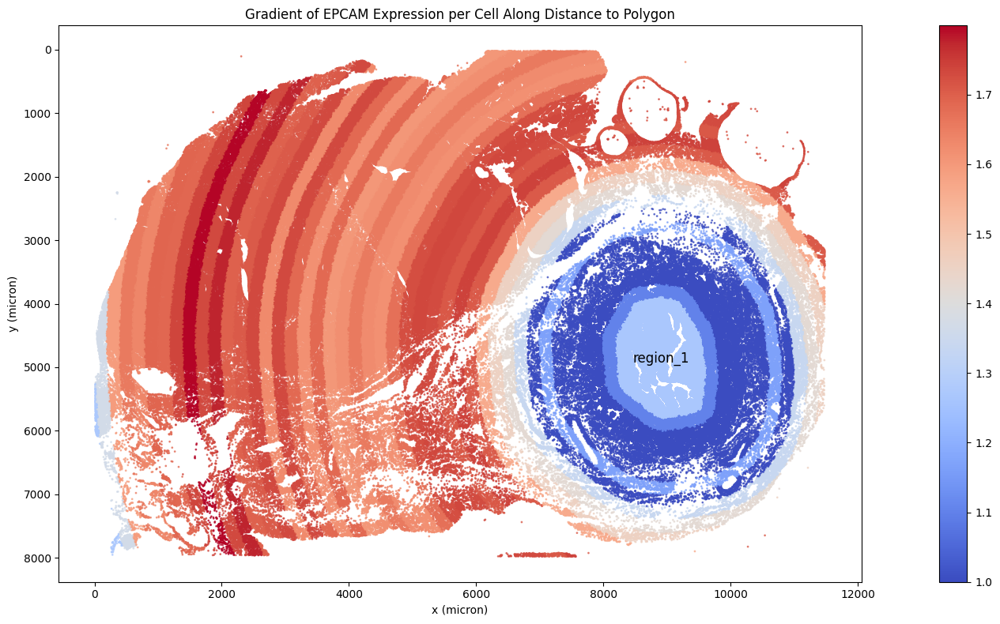

Gradient bands saved to Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs/gdf_200_um_bands_from_region_1.parquet


In [42]:
# Calculate gene gradients
band_width = 200
distance_calculator.calc_gene_gradient_to_polygon(band_width=band_width, num_bands=5, gene_list=gene_list)

# Plot gene gradients
distance_calculator.plot_gene_gradient_to_polygon(gene_list=gene_list, markersize=1)

# Save bands to Parquet
distance_calculator.save_bands_to_parquet(f"{path_landscape_files}/gdf_{band_width}_um_bands_from_{roi_name}.parquet")